Todo: find the song popularity

# Imports 
(please do pip install -r requirements.txt)

pandas_profiling is a library used specifically for eda 

In [1]:
import pandas as pd
import pandas_profiling
import numpy as np
%matplotlib inline
import seaborn as sns
import matplotlib.pyplot as plt

Loading data in memory and doing some basic preprocessing (removing id, adding source)

In [2]:
train = pd.read_csv("dataset/train.csv")
test  = pd.read_csv("dataset/test.csv")
train.drop('id', axis=1, inplace=True)
test.drop('id', axis=1, inplace=True)
train['source'] = 'train'
test ['source'] = 'test'
df = pd.concat([train, test])

In [3]:
target   = 'song_popularity'
features = test.columns.drop('source')

In [4]:
train.columns

Index(['song_duration_ms', 'acousticness', 'danceability', 'energy',
       'instrumentalness', 'key', 'liveness', 'loudness', 'audio_mode',
       'speechiness', 'tempo', 'time_signature', 'audio_valence',
       'song_popularity', 'source'],
      dtype='object')

In [5]:
df.sample(5)

,song_duration_ms,acousticness,danceability,energy,instrumentalness,key,liveness,loudness,audio_mode,speechiness,tempo,time_signature,audio_valence,song_popularity,source
23193,246603.0,0.009735,0.415580,NaN,NaN,2.0,NaN,-9.218130,1,0.030360,127.279645,3,0.532765,0.0,train
27991,227218.0,0.909492,0.274450,0.883958,0.002708,2.0,0.152873,-17.428355,0,0.038906,182.836291,3,0.295137,0.0,train
34556,176361.0,NaN,0.689305,0.863862,0.002265,4.0,NaN,-6.234842,0,0.035919,98.746715,3,0.724042,1.0,train
17651,143396.0,0.027196,0.684863,0.707343,0.001391,7.0,0.109185,-4.645199,1,0.044517,141.620315,4,0.807552,1.0,train
11745,144617.0,0.138028,0.833074,0.838056,0.000986,3.0,0.420170,-3.663901,0,0.226240,172.875086,4,0.615173,0.0,train


In [6]:
continous_columns = ['acousticness', 'danceability', 'energy', 'instrumentalness', 'liveness', 'loudness', 'speechiness', 'tempo', 'audio_valence']

In [7]:
train.isnull().sum()

song_duration_ms    4101
acousticness        3992
danceability        4026
energy              3975
instrumentalness    3985
key                 4065
liveness            4086
loudness            3957
audio_mode             0
speechiness            0
tempo                  0
time_signature         0
audio_valence          0
song_popularity        0
source                 0
dtype: int64

In [8]:
for column in df.columns:
    if column in ('source', 'song_popularity'):
        continue
    if column in continous_columns:
        median = df.loc[df['source'] == 'train', column].median()
        print(column, median)
        df[column].fillna(median, inplace=True)
    else:
        mode = df.loc[df['source'] == 'test', column].mode()[0]
        print(column, mode)
        df[column].fillna(mode, inplace=True)
        

song_duration_ms 161760.0
acousticness 0.14053234888623756
danceability 0.6082338355736929
energy 0.7044533182633863
instrumentalness 0.0019744766301669
key 0.0
liveness 0.13594518271937028
loudness -6.345412615480568
audio_mode 0
speechiness 0.0558807732613924
tempo 113.79595942988647
time_signature 3
audio_valence 0.5988269955094705


In [9]:
df.isnull().sum()

song_duration_ms        0
acousticness            0
danceability            0
energy                  0
instrumentalness        0
key                     0
liveness                0
loudness                0
audio_mode              0
speechiness             0
tempo                   0
time_signature          0
audio_valence           0
song_popularity     10000
source                  0
dtype: int64

In [10]:
profile = pandas_profiling.ProfileReport(df[df['source'] == 'train'].drop('source', axis=1))

profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

song_popularity 63.6% 0 to 36.4% 1 </br>
maybe class imbalance

little correlation between acousticness and energy (-ve correlation)</br>
little correlation between acousticness and loudness (-ve correlation)</br>
this makes sense, acoustic songs tend to be slow, and not so loud</br>
daceability and acousticness has no correlation, which I was not expecting</br>


# target vs column features

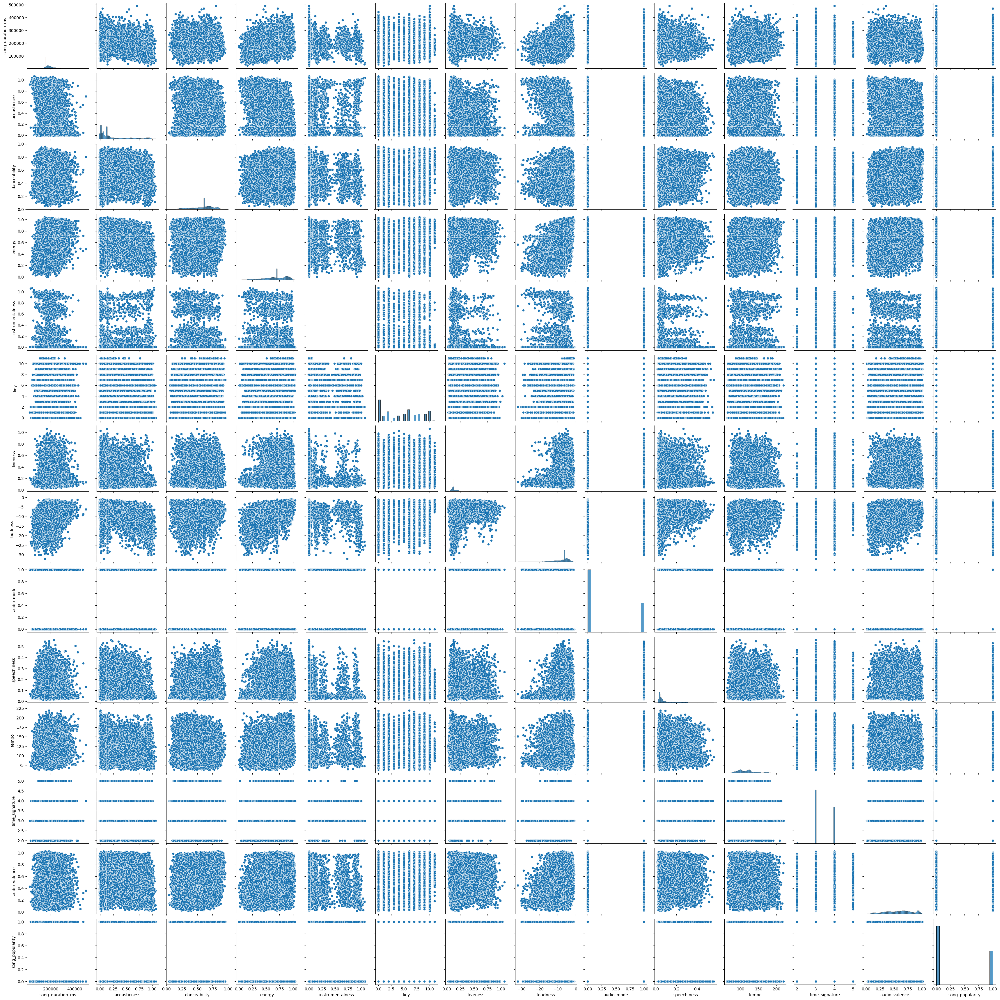

In [16]:
sns.pairplot(df[df['source'] == 'train'].drop('source', axis=1))

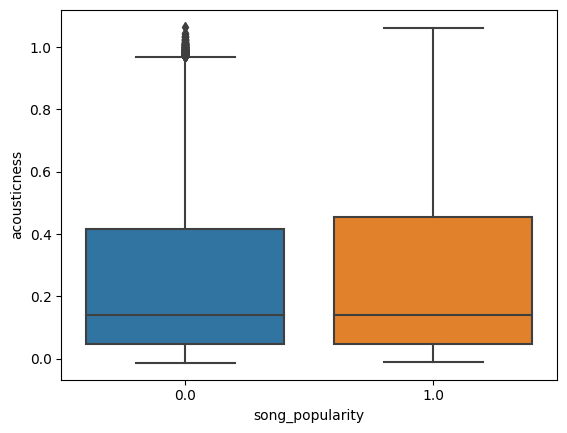

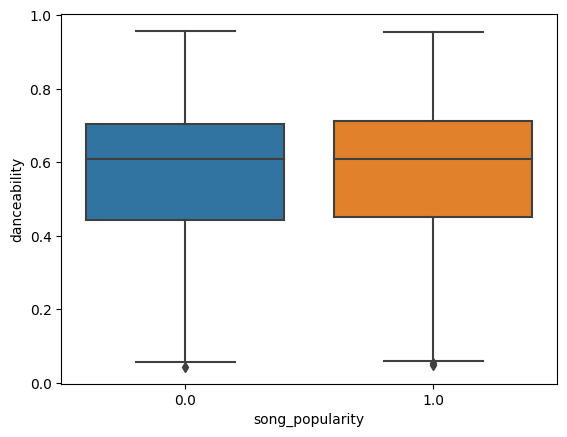

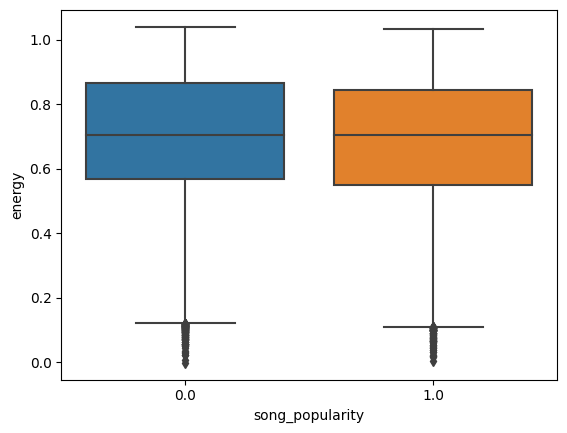

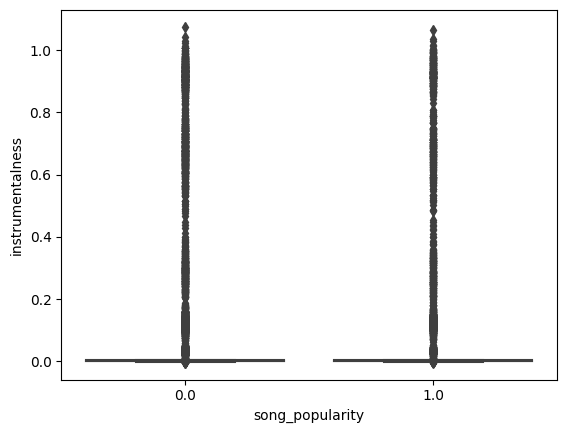

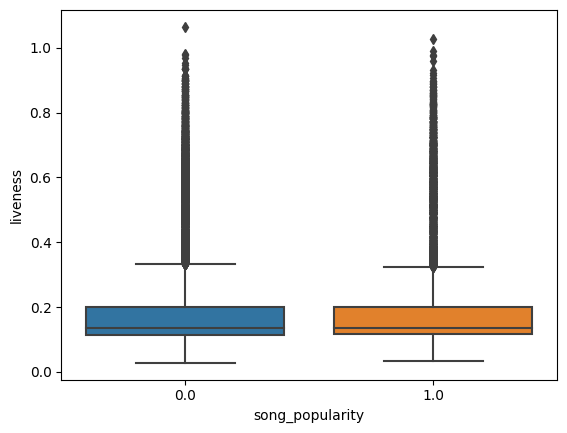

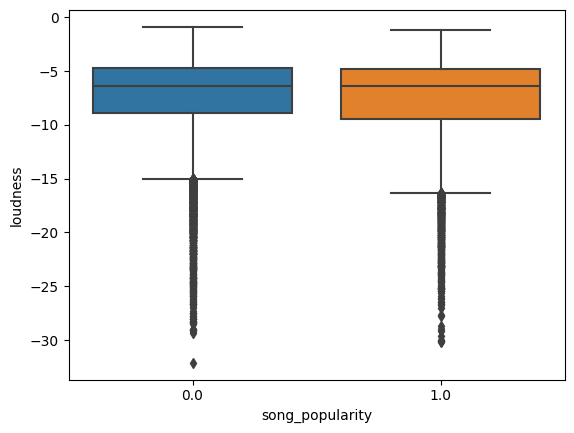

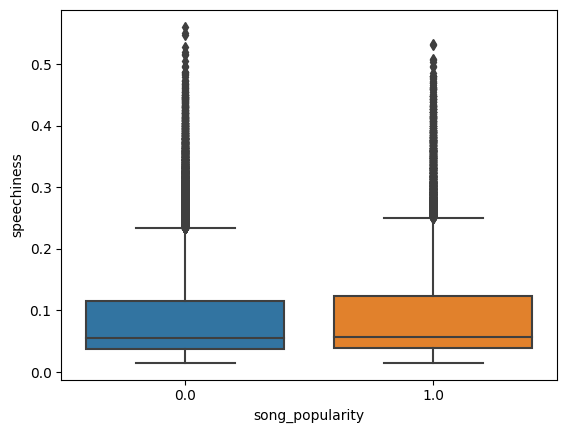

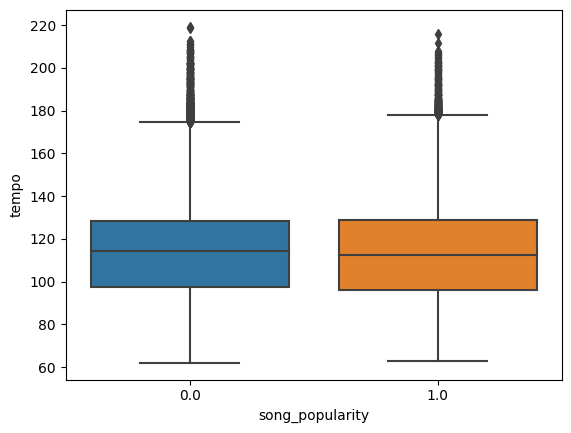

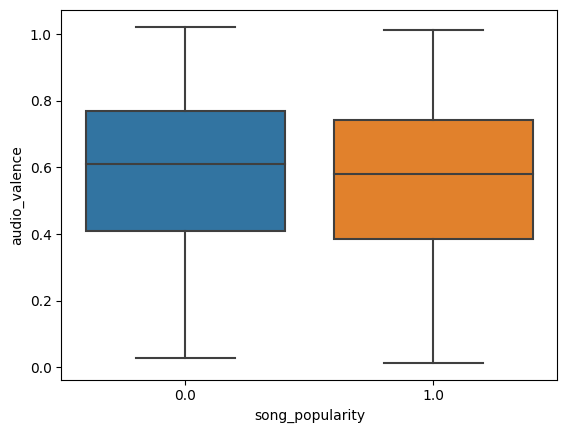

In [17]:
for i, column in enumerate(continous_columns):
    plt.figure()
    sns.boxplot(y = df[df['source'] == 'train'][column], x = df[df['source'] == 'train'][target])

Outliers might be a problem, some form of scaling required!

In [18]:
categorical_columns = [column for column in list(df.columns) if column not in set(continous_columns)]
categorical_columns.pop(categorical_columns.index('source'))
categorical_columns.pop(categorical_columns.index('song_popularity'))

'song_popularity'

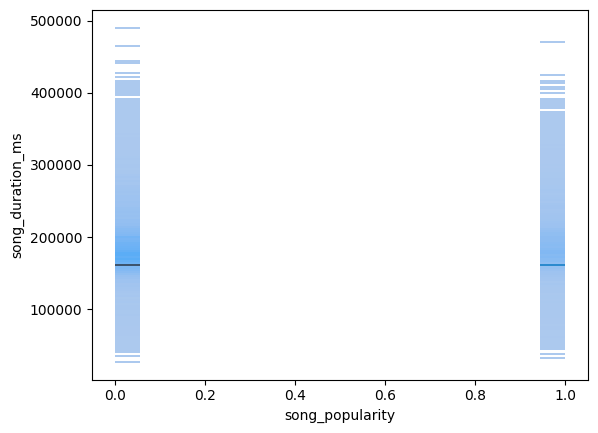

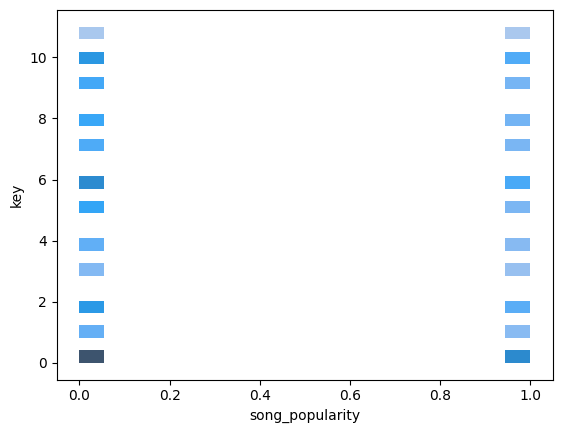

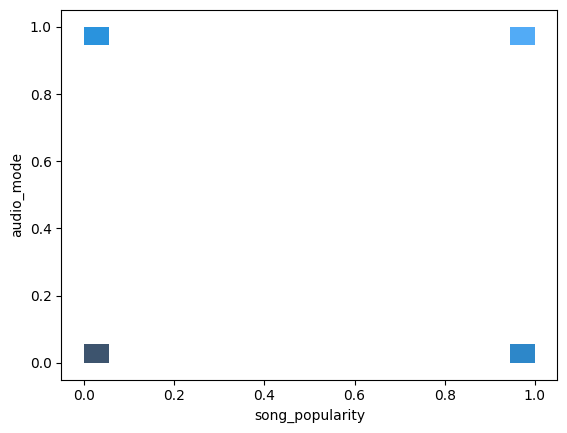

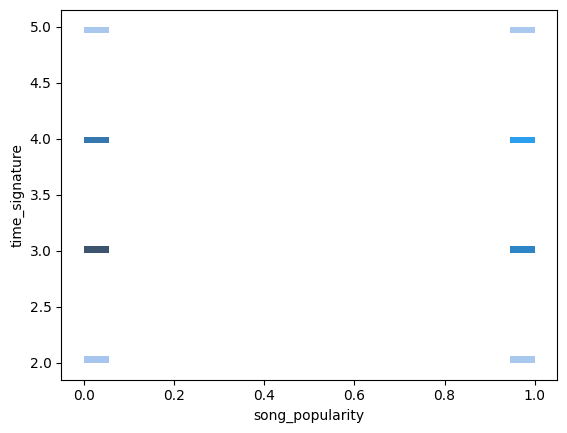

In [19]:
for i, column in enumerate(categorical_columns):
    plt.figure()
    sns.histplot(y = df[df['source'] == 'train'][column], x = df[df['source'] == 'train'][target])